In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import re
import seaborn as sns

In [2]:
! pip install opencv-python
import cv2

# Exploration of the bbox labels

In [3]:
# reading files into pandas df for statistical analysis
# bbox dir
bbox_label_list = list()
bbox_label_dir = "C:\\Users\\dovid\\PycharmProjects\\CV_hw1_old\\HW1_dataset\\HW1_dataset\\train_labels"
for f in os.listdir(bbox_label_dir):
    temp_bbox_label_df = pd.read_csv(os.path.join(bbox_label_dir, f), sep=" ", header=None)
    temp_bbox_label_df['file_name'] = f
    # temp_bbox_label_df['duration'] = int(re.findall(r'\d+', f)[-1]) - int(re.findall(r'\d+', f)[-2]) + 1
    bbox_label_list.append(temp_bbox_label_df)
bbox_label_dir = "C:\\Users\\dovid\\PycharmProjects\\CV_hw1_old\\HW1_dataset\\HW1_dataset\\valid_labels"
for f in os.listdir(bbox_label_dir):
    temp_bbox_label_df = pd.read_csv(os.path.join(bbox_label_dir, f), sep=" ", header=None)
    temp_bbox_label_df['file_name'] = f
    # temp_bbox_label_df['duration'] = int(re.findall(r'\d+', f)[-1]) - int(re.findall(r'\d+', f)[-2]) + 1
    bbox_label_list.append(temp_bbox_label_df)
bbox_label_df = pd.concat(bbox_label_list)

In [4]:
mapping = dict(zip(range(8), ["Right_Scissors","Left_Scissors","Right_Needle_driver","Left_Needle_driver","Right_Forceps","Left_Forceps","Right_Empty","Left_Empty"]))

In [14]:
mapping

{0: 'Right_Scissors',
 1: 'Left_Scissors',
 2: 'Right_Needle_driver',
 3: 'Left_Needle_driver',
 4: 'Right_Forceps',
 5: 'Left_Forceps',
 6: 'Right_Empty',
 7: 'Left_Empty'}

In [5]:
bbox_label_df.columns = ['label', 'x', 'y', 'w', 'h', 'file_name']#, 'duration']
bbox_label_df['label_names'] = bbox_label_df['label'].map(mapping)

In [55]:
bbox_label_df.head()

,label,x,y,w,h,file_name,label_names
0,7,0.573817,0.298641,0.142741,0.245652,P016_balloon1_1006.txt,Left_Empty
1,2,0.428222,0.441576,0.352365,0.264130,P016_balloon1_1006.txt,Right_Needle_driver
0,7,0.750408,0.335598,0.205546,0.204348,P016_balloon1_1107.txt,Left_Empty
1,2,0.446166,0.413859,0.277325,0.408696,P016_balloon1_1107.txt,Right_Needle_driver
0,2,0.448613,0.408967,0.283850,0.407609,P016_balloon1_1114.txt,Right_Needle_driver


In [7]:
bbox_label_df.describe()

,label,x,y,w,h
count,1576.000000,1576.000000,1576.000000,1576.000000,1576.000000
mean,4.027919,0.565359,0.485929,0.192191,0.241672
std,2.543685,0.163814,0.082229,0.061996,0.057680
min,0.000000,0.039967,0.151977,0.075846,0.114851
25%,2.000000,0.461639,0.441493,0.143756,0.199586
50%,5.000000,0.559020,0.502081,0.182647,0.233797
75%,7.000000,0.700245,0.541083,0.230883,0.278229
max,7.000000,0.962077,0.713668,0.437194,0.473913


As we can see below several images have only one label and two have 3 labels

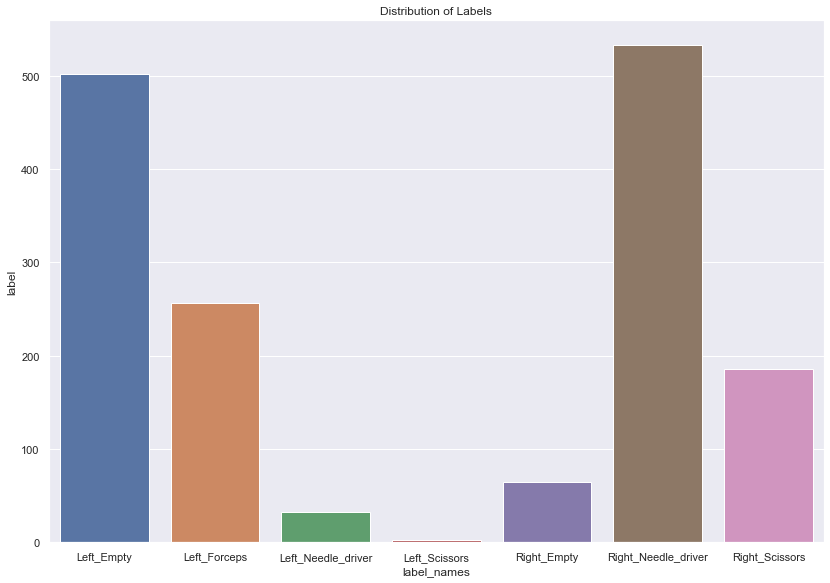

In [8]:
# right vs. left
# right = bbox_label_df[bbox_label_df['label_names'].str.contains("Right")].shape[0]
# left = bbox_label_df[bbox_label_df['label_names'].str.contains("Left")].shape[0]

sns.set(rc={'figure.figsize':(11.7,8.27)})
by_label = bbox_label_df.groupby("label_names").count()

sns.barplot(data=by_label, x=by_label.index, y="label")
plt.title("Distribution of Labels")
plt.tight_layout()
plt.show()

As we can see there is a large degree of imbalance between left and right. The imbalance is different between different groupings. Significantly, there is no example whatsoever of Right_Forceps. All of the above are concerning for inference.


We will look at some examples of each labeling in order to get a better idea of the quality of our labelings and especially of the barely represented groups. 

In [8]:
image_dir = "C:\\Users\\dovid\\PycharmProjects\\CV_hw1_old\\HW1_dataset\\HW1_dataset\\images"

## Left scissors

In [9]:
bbox_label_df[bbox_label_df.label_names == "Left_Scissors"].file_name

1    P016_balloon1_4098.txt
1    P017_balloon1_3806.txt
Name: file_name, dtype: object

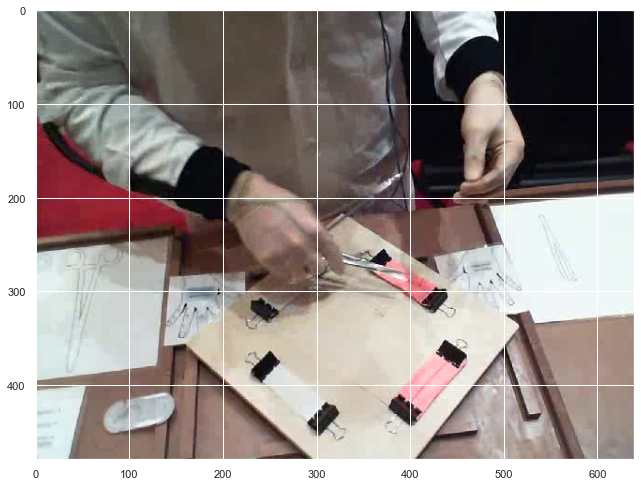

In [13]:
img = cv2.imread(os.path.join(image_dir, 'P016_balloon1_4098.jpg'))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)		# this converts it into RGB

plt.imshow(rgb_img)
plt.show()

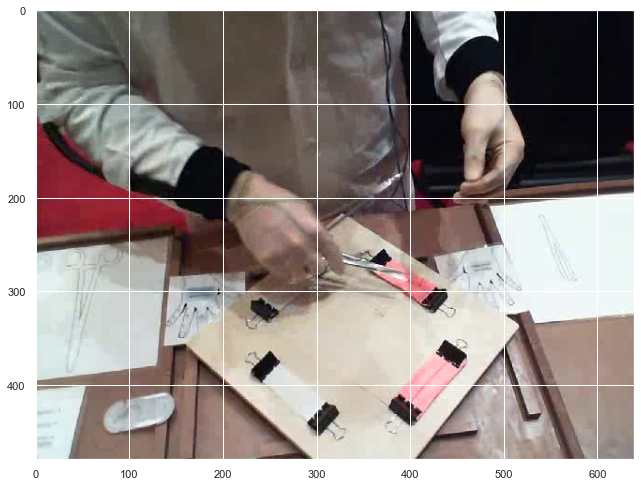

In [51]:
img = cv2.imread(os.path.join(image_dir, 'P016_balloon1_4098.jpg'))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)		# this converts it into RGB

plt.imshow(rgb_img)
plt.show()

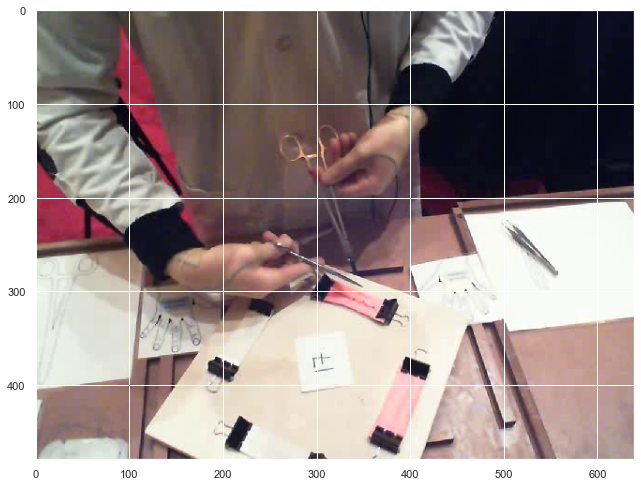

In [50]:
img = cv2.imread(os.path.join(image_dir, 'P017_balloon1_3806.jpg'))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)		# this converts it into RGB

plt.imshow(rgb_img)
plt.show()

#### In addition to this label being scarse, the first image shows that it is also unreliable. From the second image it also seems that the tools are only being handed to the right hand. Not that a left handed surgeon is using them the way that right handed surgeon would use them.

## Right Scissors

In [62]:
bbox_label_df[bbox_label_df.label_names == "Right_Scissors"].file_name.tail()

1    P040_balloon1_2669.txt
1     P040_balloon1_906.txt
1     P040_balloon1_915.txt
0     P040_balloon1_952.txt
0     P040_balloon1_982.txt
Name: file_name, dtype: object

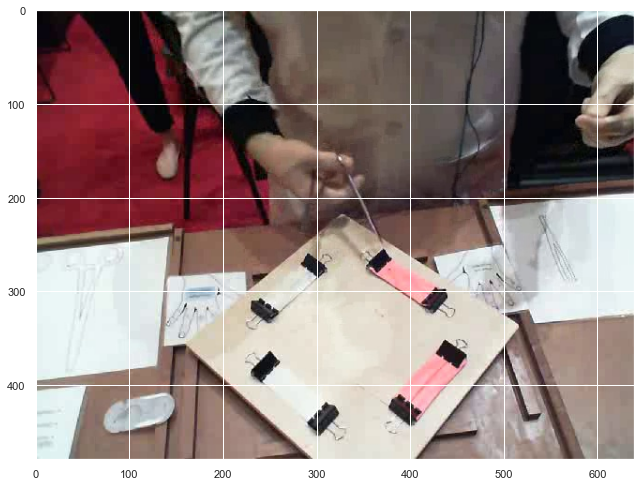

In [61]:
img = cv2.imread(os.path.join(image_dir, 'P016_balloon1_1411.jpg'))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)		# this converts it into RGB

plt.imshow(rgb_img)
plt.show()

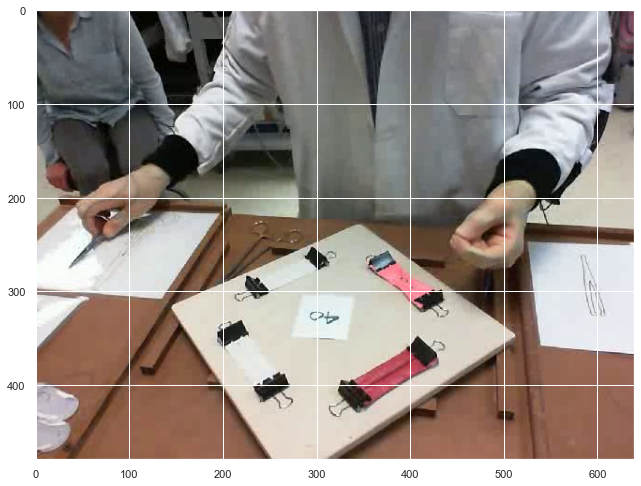

In [63]:
img = cv2.imread(os.path.join(image_dir, 'P040_balloon1_2669.jpg'))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)		# this converts it into RGB

plt.imshow(rgb_img)
plt.show()

#### Nothing to note

## Left Forceps

In [66]:
bbox_label_df[bbox_label_df.label_names == "Left_Forceps"].file_name.tail()

0     P040_balloon1_423.txt
1     P040_balloon1_452.txt
1     P040_balloon1_462.txt
0     P040_balloon1_590.txt
0    P017_balloon1_1862.txt
Name: file_name, dtype: object

In [ ]:
img = cv2.imread(os.path.join(image_dir, 'P016_balloon1_1831.jpg'))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)		# this converts it into RGB

plt.imshow(rgb_img)
plt.show()

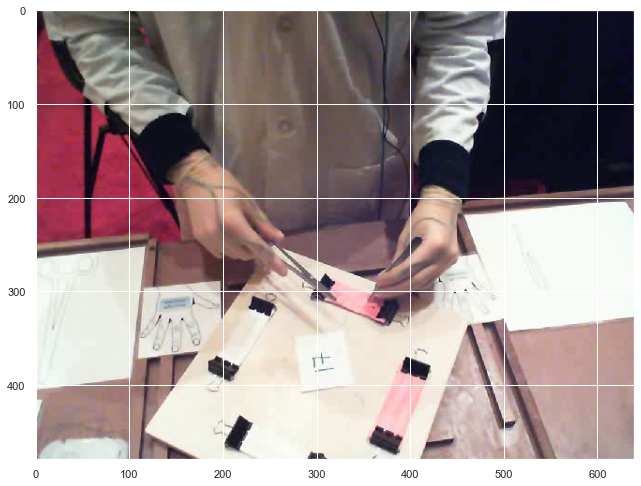

In [69]:
img = cv2.imread(os.path.join(image_dir, 'P017_balloon1_1862.jpg'))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)		# this converts it into RGB

plt.imshow(rgb_img)
plt.show()

#### Nothing to report

### There are no Right Forceps in training/validation data

In [29]:
bbox_label_df[bbox_label_df.label_names == "Right_Forceps"].file_name

Series([], Name: file_name, dtype: object)

## Left Needle Driver

In [74]:
bbox_label_df[bbox_label_df.label_names == "Left_Needle_driver"].file_name.tail()

0    P027_balloon1_5318.txt
0    P027_balloon1_5332.txt
1    P027_balloon1_5334.txt
1    P036_balloon1_4826.txt
1    P036_balloon1_5293.txt
Name: file_name, dtype: object

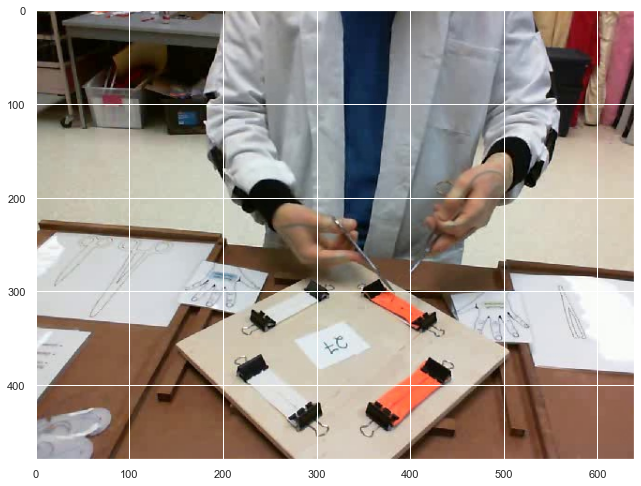

In [75]:
img = cv2.imread(os.path.join(image_dir, 'P027_balloon1_5334.jpg'))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)		# this converts it into RGB

plt.imshow(rgb_img)
plt.show()

In [21]:
bbox_label_df[bbox_label_df['file_name'].str.contains('P016_balloon1_288')]

,label,x,y,w,h,file_name,label_names
0,7,0.737923,0.519899,0.152159,0.286604,P016_balloon1_288.txt,Left_Empty
1,3,0.095840,0.487364,0.191680,0.357337,P016_balloon1_288.txt,Left_Needle_driver


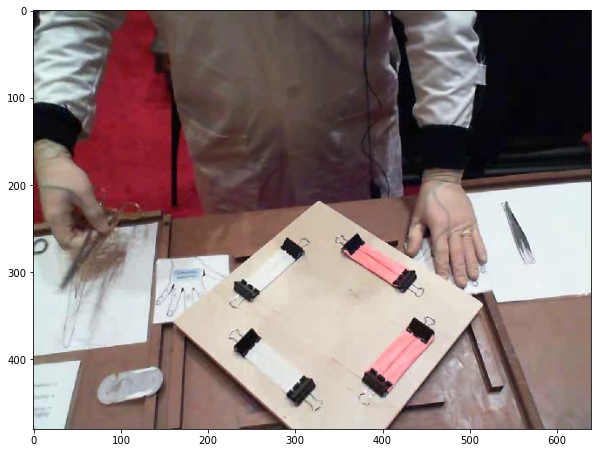

In [22]:
img = cv2.imread(os.path.join(image_dir, 'P016_balloon1_288.jpg'))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)		# this converts it into RGB
plt.figure(figsize=(10, 10))
plt.imshow(rgb_img)
plt.show()

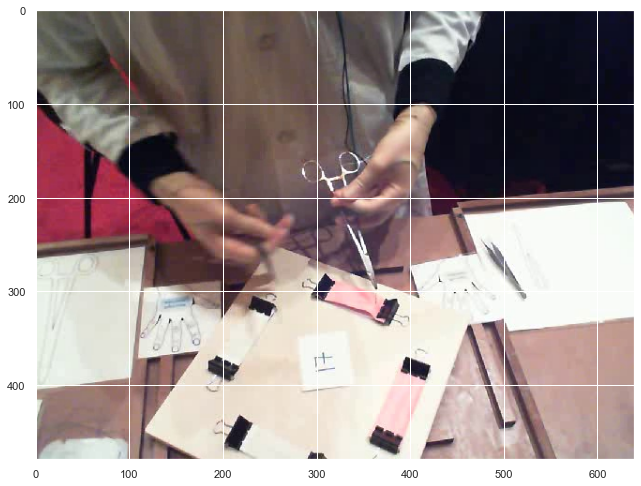

In [72]:
img = cv2.imread(os.path.join(image_dir, 'P017_balloon1_1493.jpg'))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)		# this converts it into RGB

plt.imshow(rgb_img)
plt.show()

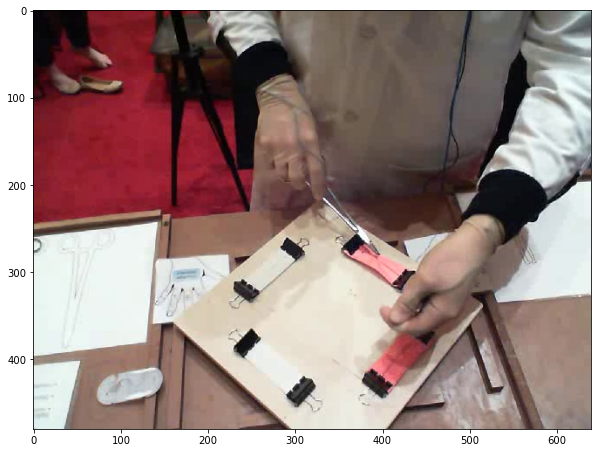

In [15]:
img = cv2.imread(os.path.join(image_dir, 'P016_balloon1_2272.jpg'))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)		# this converts it into RGB

plt.figure(figsize=(10, 10))
plt.imshow(rgb_img)

plt.show()

## Right Needle Driver

In [18]:
bbox_label_df[bbox_label_df.label_names == "Right_Needle_driver"].file_name.head()

1    P016_balloon1_1006.txt
1    P016_balloon1_1107.txt
0    P016_balloon1_1114.txt
1    P016_balloon1_1174.txt
1    P016_balloon1_1188.txt
Name: file_name, dtype: object

In [23]:
bbox_label_df[bbox_label_df['file_name'].str.contains('P016_balloon1_1188')]

,label,x,y,w,h,file_name,label_names
0,7,0.661844,0.619587,0.302450,0.326480,P016_balloon1_1188.txt,Left_Empty
1,2,0.490212,0.330163,0.231648,0.430435,P016_balloon1_1188.txt,Right_Needle_driver


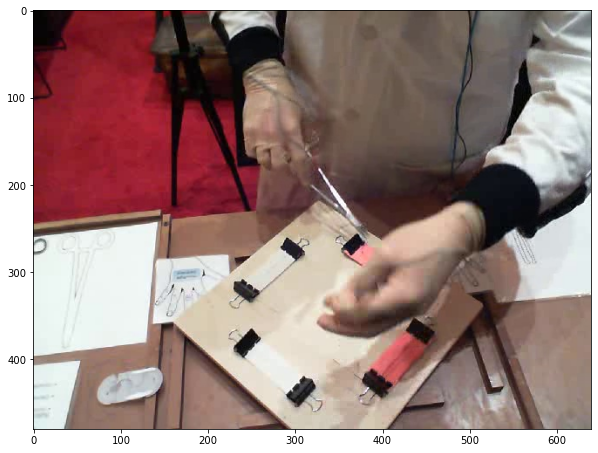

In [20]:
img = cv2.imread(os.path.join(image_dir, 'P016_balloon1_1188.jpg'))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)		# this converts it into RGB
plt.figure(figsize=(10, 10))
plt.imshow(rgb_img)
plt.show()

In [24]:
bbox_label_df[bbox_label_df['file_name'].str.contains('P016_balloon1_1006')]

,label,x,y,w,h,file_name,label_names
0,7,0.573817,0.298641,0.142741,0.245652,P016_balloon1_1006.txt,Left_Empty
1,2,0.428222,0.441576,0.352365,0.264130,P016_balloon1_1006.txt,Right_Needle_driver


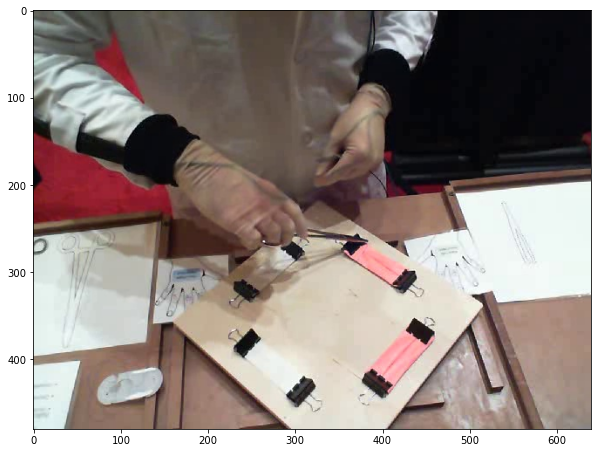

In [19]:
img = cv2.imread(os.path.join(image_dir, 'P016_balloon1_1006.jpg'))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)		# this converts it into RGB
plt.figure(figsize=(10, 10))
plt.imshow(rgb_img)
plt.show()

In [25]:
bbox_label_df[bbox_label_df['file_name'].str.contains('P040_balloon1_326')]

,label,x,y,w,h,file_name,label_names
0,2,0.522352,0.476836,0.192373,0.282486,P040_balloon1_326.txt,Right_Needle_driver
1,5,0.741420,0.535593,0.194915,0.230508,P040_balloon1_326.txt,Left_Forceps


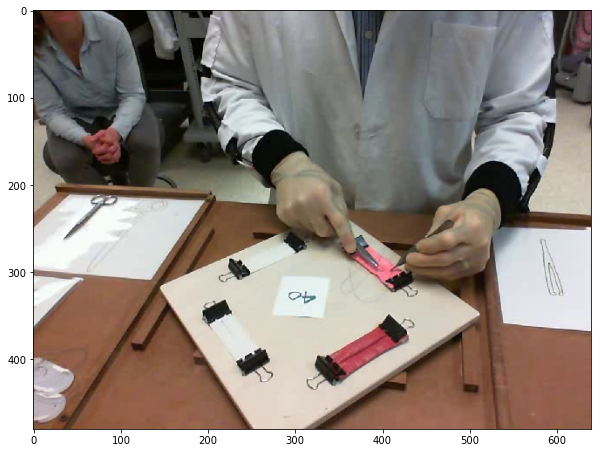

In [17]:
img = cv2.imread(os.path.join(image_dir, 'P040_balloon1_326.jpg'))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)		# this converts it into RGB
plt.figure(figsize=(10, 10))
plt.imshow(rgb_img)
plt.show()

In [26]:
bbox_label_df[bbox_label_df['file_name'].str.contains('P040_balloon1_1194')]

,label,x,y,w,h,file_name,label_names
0,2,0.471928,0.302260,0.194915,0.166102,P040_balloon1_1194.txt,Right_Needle_driver
1,7,0.853708,0.391525,0.185593,0.238418,P040_balloon1_1194.txt,Left_Empty


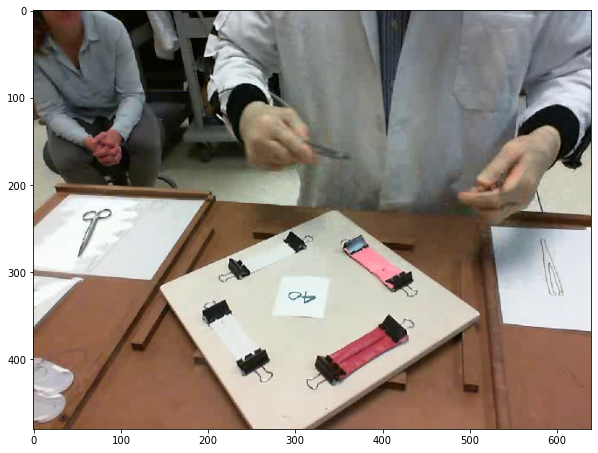

In [16]:
img = cv2.imread(os.path.join(image_dir, 'P040_balloon1_1194.jpg'))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)		# this converts it into RGB
plt.figure(figsize=(10, 10))
plt.imshow(rgb_img)
plt.show()

## Left Empty

In [30]:
bbox_label_df[bbox_label_df.label_names == "Left_Empty"].file_name.tail()

1    P040_balloon1_1194.txt
0     P040_balloon1_203.txt
0    P040_balloon1_2672.txt
1     P040_balloon1_804.txt
1     P040_balloon1_923.txt
Name: file_name, dtype: object

In [31]:
bbox_label_df[bbox_label_df['file_name'].str.contains('P040_balloon1_2672')]

,label,x,y,w,h,file_name,label_names
0,7,0.769984,0.476359,0.148450,0.194565,P040_balloon1_2672.txt,Left_Empty
1,0,0.150318,0.464972,0.165254,0.227119,P040_balloon1_2672.txt,Right_Scissors


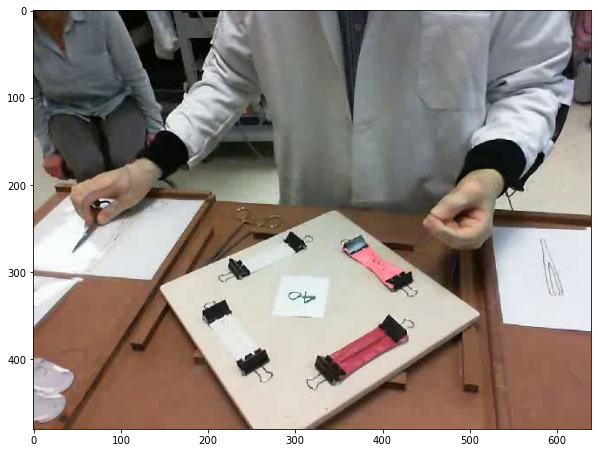

In [32]:
img = cv2.imread(os.path.join(image_dir, 'P040_balloon1_2672.jpg'))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)		# this converts it into RGB
plt.figure(figsize=(10, 10))
plt.imshow(rgb_img)
plt.show()

In [28]:
bbox_label_df[bbox_label_df['file_name'].str.contains('P016_balloon1_1006')]

,label,x,y,w,h,file_name,label_names
0,7,0.573817,0.298641,0.142741,0.245652,P016_balloon1_1006.txt,Left_Empty
1,2,0.428222,0.441576,0.352365,0.264130,P016_balloon1_1006.txt,Right_Needle_driver


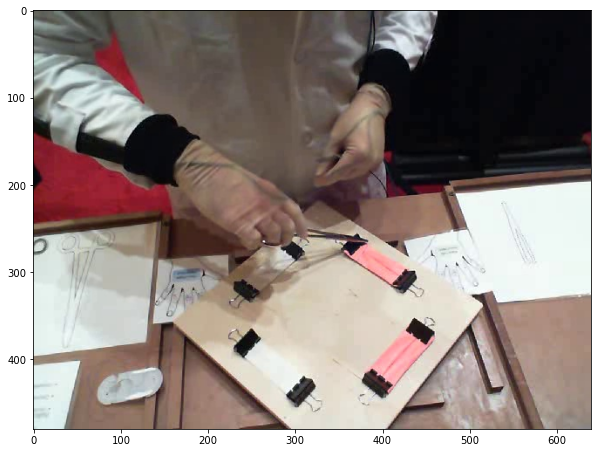

In [29]:
img = cv2.imread(os.path.join(image_dir, 'P016_balloon1_1006.jpg'))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)		# this converts it into RGB
plt.figure(figsize=(10, 10))
plt.imshow(rgb_img)
plt.show()

## Right Empty

In [36]:
bbox_label_df[bbox_label_df.label_names == "Right_Empty"].file_name.head()

1    P016_balloon1_2895.txt
0      P016_balloon1_57.txt
0       P016_balloon1_9.txt
0    P017_balloon1_1493.txt
0    P017_balloon1_1785.txt
Name: file_name, dtype: object

In [34]:
bbox_label_df[bbox_label_df['file_name'].str.contains('P035_balloon1_1331')]

,label,x,y,w,h,file_name,label_names
0,6,0.222584,0.475371,0.125940,0.233663,P035_balloon1_1331.txt,Right_Empty
1,7,0.707869,0.431312,0.144766,0.163366,P035_balloon1_1331.txt,Left_Empty


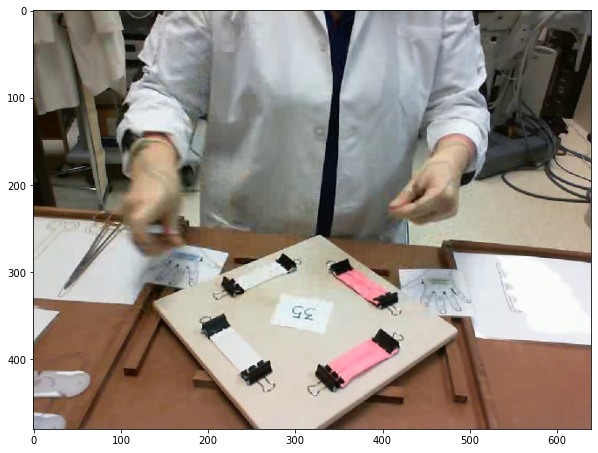

In [35]:
img = cv2.imread(os.path.join(image_dir, 'P035_balloon1_1331.jpg'))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)		# this converts it into RGB
plt.figure(figsize=(10, 10))
plt.imshow(rgb_img)
plt.show()

In [37]:
bbox_label_df[bbox_label_df['file_name'].str.contains('P017_balloon1_1493')]

,label,x,y,w,h,file_name,label_names
0,6,0.311990,0.479212,0.243883,0.239402,P017_balloon1_1493.txt,Right_Empty
1,3,0.556688,0.414402,0.232463,0.416304,P017_balloon1_1493.txt,Left_Needle_driver


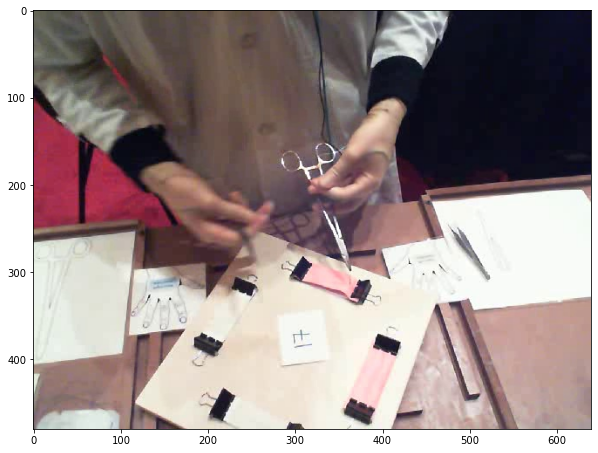

In [38]:
img = cv2.imread(os.path.join(image_dir, 'P017_balloon1_1493.jpg'))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)		# this converts it into RGB
plt.figure(figsize=(10, 10))
plt.imshow(rgb_img)
plt.show()

As we show below, there are 11 instances where there are not two labels

In [47]:
bbox_label_df.groupby('file_name').count().sort_values(by='label').groupby('label').count()

,x,y,w,h,label_names
label,,,,,
1,9,9,9,9,9
2,911,911,911,911,911
3,2,2,2,2,2


In [42]:
bbox_label_df.groupby('file_name').count().sort_values(by='label')

,label,x,y,w,h,label_names
file_name,,,,,,
P035_balloon1_1844.txt,1,1,1,1,1,1
P017_balloon1_1460.txt,1,1,1,1,1,1
P017_balloon1_1461.txt,1,1,1,1,1,1
P022_balloon1_2997.txt,1,1,1,1,1,1
P016_balloon1_2928.txt,1,1,1,1,1,1
...,...,...,...,...,...,...
P024_balloon1_1776.txt,2,2,2,2,2,2
P022_balloon1_7435.txt,2,2,2,2,2,2
P040_balloon1_982.txt,2,2,2,2,2,2


In [45]:
bbox_label_df[bbox_label_df['file_name'].str.contains('P016_balloon1_2928')]

,label,x,y,w,h,file_name,label_names
0,7,0.713186,0.320522,0.196033,0.269159,P016_balloon1_2928.txt,Left_Empty


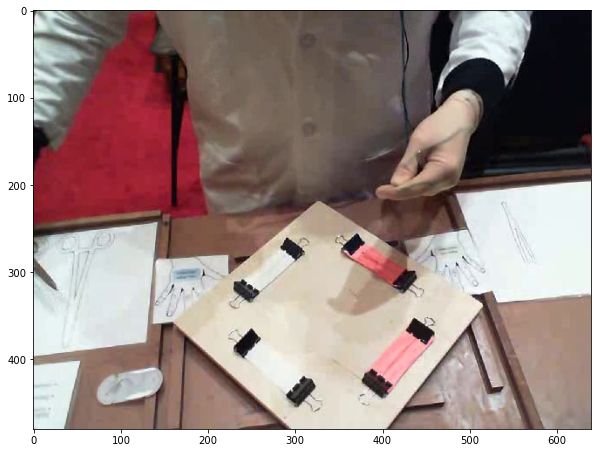

In [46]:
img = cv2.imread(os.path.join(image_dir, 'P016_balloon1_2928.jpg'))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)		# this converts it into RGB
plt.figure(figsize=(10, 10))
plt.imshow(rgb_img)
plt.show()

In [43]:
bbox_label_df[bbox_label_df['file_name'].str.contains('P035_balloon1_1844')]

,label,x,y,w,h,file_name,label_names
0,2,0.527468,0.506559,0.302153,0.133663,P035_balloon1_1844.txt,Right_Needle_driver


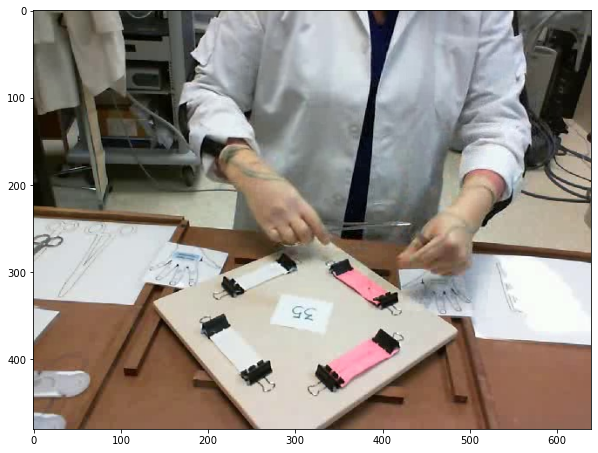

In [44]:
img = cv2.imread(os.path.join(image_dir, 'P035_balloon1_1844.jpg'))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)		# this converts it into RGB
plt.figure(figsize=(10, 10))
plt.imshow(rgb_img)
plt.show()

It appears that sometimes having only one label is a mistake and sometimes it is because the other hand is not in the picture

We will now explore cases where two labels were given for one hand

In [51]:
parity_check = bbox_label_df.groupby('file_name').sum()[['label']]

In [53]:
parity_check[(parity_check['label'].astype(int) % 2) == 0]

,label
file_name,
P016_balloon1_2272.txt,10
P016_balloon1_2609.txt,16
P016_balloon1_288.txt,10
P016_balloon1_4098.txt,8
P022_balloon1_2997.txt,0
P030_balloon1_6931.txt,0
P035_balloon1_1844.txt,2
P036_balloon1_4826.txt,8
P040_balloon1_2385.txt,2


In [59]:
bbox_label_df[bbox_label_df['file_name'].str.contains('P016_balloon1_4098')]

,label,x,y,w,h,file_name,label_names
0,7,0.755193,0.284385,0.121354,0.296573,P016_balloon1_4098.txt,Left_Empty
1,1,0.473899,0.483016,0.305057,0.251359,P016_balloon1_4098.txt,Left_Scissors
2,0,0.474804,0.481101,0.302352,0.248769,P016_balloon1_4098.txt,Right_Scissors


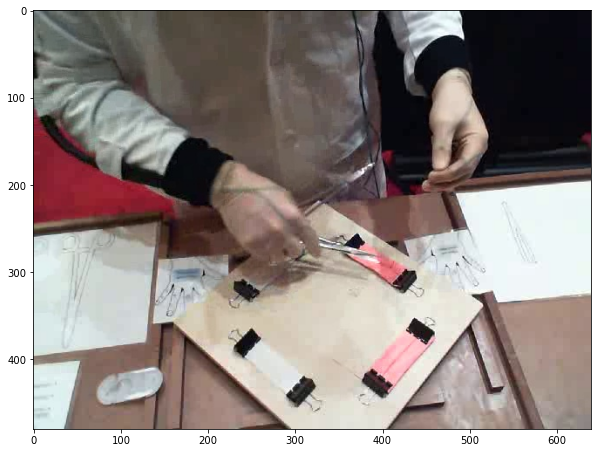

In [60]:
img = cv2.imread(os.path.join(image_dir, 'P016_balloon1_4098.jpg'))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)		# this converts it into RGB
plt.figure(figsize=(10, 10))
plt.imshow(rgb_img)
plt.show()

In [57]:
bbox_label_df[bbox_label_df['file_name'].str.contains('P016_balloon1_2609')]

,label,x,y,w,h,file_name,label_names
0,2,0.442904,0.436141,0.350734,0.311957,P016_balloon1_2609.txt,Right_Needle_driver
1,7,0.605220,0.361141,0.125612,0.279348,P016_balloon1_2609.txt,Left_Empty
2,7,0.590131,0.358424,0.155791,0.282609,P016_balloon1_2609.txt,Left_Empty


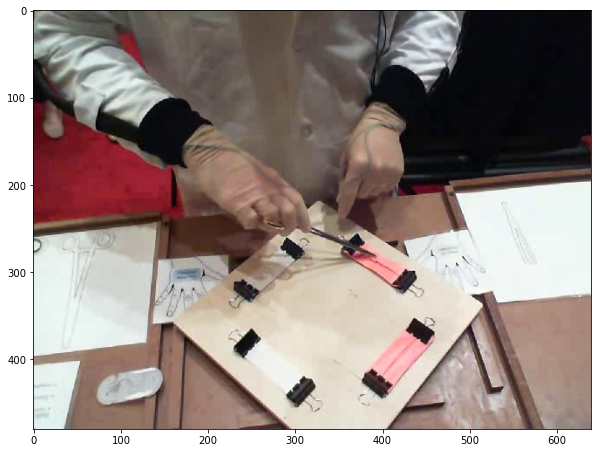

In [58]:
img = cv2.imread(os.path.join(image_dir, 'P016_balloon1_2609.jpg'))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)		# this converts it into RGB
plt.figure(figsize=(10, 10))
plt.imshow(rgb_img)
plt.show()

In [55]:
bbox_label_df[bbox_label_df['file_name'].str.contains('P022_balloon1_2997')]

,label,x,y,w,h,file_name,label_names
0,0,0.327488,0.430707,0.10522,0.253261,P022_balloon1_2997.txt,Right_Scissors


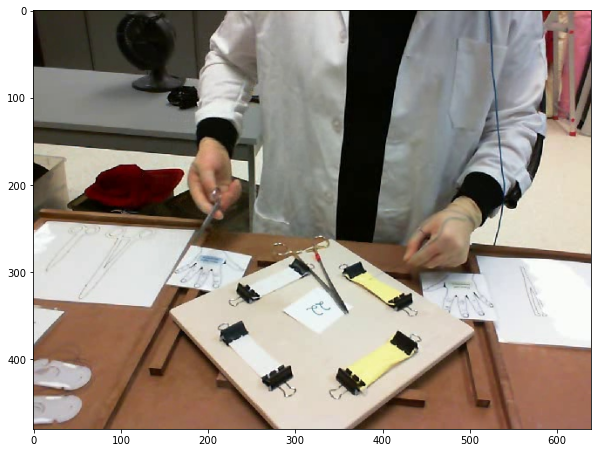

In [56]:
img = cv2.imread(os.path.join(image_dir, 'P022_balloon1_2997.jpg'))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)		# this converts it into RGB
plt.figure(figsize=(10, 10))
plt.imshow(rgb_img)
plt.show()

# Exploration of the tool usage

In [69]:
tool_mapping = {"T0": "no tool in hand", "T1": "needle_driver", "T2":"forceps", "T3": "Scissors"}

In [73]:
left_label_list = list()
left_tools_dir = "C:\\Users\\dovid\\PycharmProjects\\CV_hw1_old\\HW1_dataset\\HW1_dataset\\tool_usage\\tools_left"
for f in os.listdir(left_tools_dir):
    temp_left_tu_df = pd.read_csv(os.path.join(left_tools_dir, f), sep=" ", header=None)
    temp_left_tu_df['file_name'] = f
    left_label_list.append(temp_left_tu_df)
left_tu_df = pd.concat(left_label_list)
left_tu_df.columns = ['start_time', 'finish_time', 'tool', 'file_name']
left_tu_df['tool_name'] = left_tu_df.tool.map(tool_mapping)
left_tu_df['duration'] = left_tu_df['finish_time'] - left_tu_df['start_time']

right_label_list = list()
right_tools_dir = "C:\\Users\\dovid\\PycharmProjects\\CV_hw1_old\\HW1_dataset\\HW1_dataset\\tool_usage\\tools_right"
for f in os.listdir(right_tools_dir):
    temp_right_tu_df = pd.read_csv(os.path.join(right_tools_dir, f), sep=" ", header=None)
    temp_right_tu_df['file_name'] = f
    right_label_list.append(temp_right_tu_df)
right_tu_df = pd.concat(right_label_list)
right_tu_df.columns = ['start_time', 'finish_time', 'tool', 'file_name']
right_tu_df['tool_name'] = right_tu_df.tool.map(tool_mapping)
right_tu_df['duration'] = right_tu_df['finish_time'] - right_tu_df['start_time']

In [74]:
left_tu_df.head()

,start_time,finish_time,tool,file_name,tool_name,duration
0,0,308,T0,P016_balloon1.txt,no tool in hand,308
1,309,674,T2,P016_balloon1.txt,forceps,365
2,675,1649,T0,P016_balloon1.txt,no tool in hand,974
3,1650,2126,T2,P016_balloon1.txt,forceps,476
4,2127,3084,T0,P016_balloon1.txt,no tool in hand,957


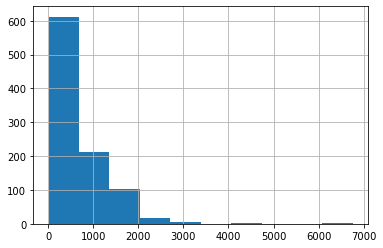

In [76]:
left_tu_df.duration.hist()
plt.show()

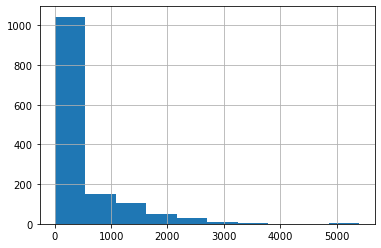

In [77]:
right_tu_df.duration.hist()
plt.show()

As we can see the right hand has more variance. More shorter durations and more extreme long durations

In [82]:
left_tu_df.groupby('tool_name').sum().duration

tool_name
Scissors             3192
forceps            160228
needle_driver       31268
no tool in hand    428453
Name: duration, dtype: int64

In [83]:
right_tu_df.groupby('tool_name').sum().duration

tool_name
Scissors            54069
forceps              6636
needle_driver      497603
no tool in hand     64382
Name: duration, dtype: int64

The left hand favors the forceps and being inactive, while the right hand favors scissors and the needle_driver

In [89]:
! pip install duckdb

In [90]:
import duckdb

In [96]:
left_df = duckdb.query("""SELECT *, lead(tool, 1) over (partition by file_name order by file_name, start_time) as next_tool FROM left_tu_df""").df()

In [100]:
left_df['next_tool_name'] = left_df.next_tool.map(tool_mapping)

In [101]:
left_df['transition'] = left_df['tool_name'] + ", " + left_df['next_tool_name']

The left hand mainly moves between picking up and putting down the forceps

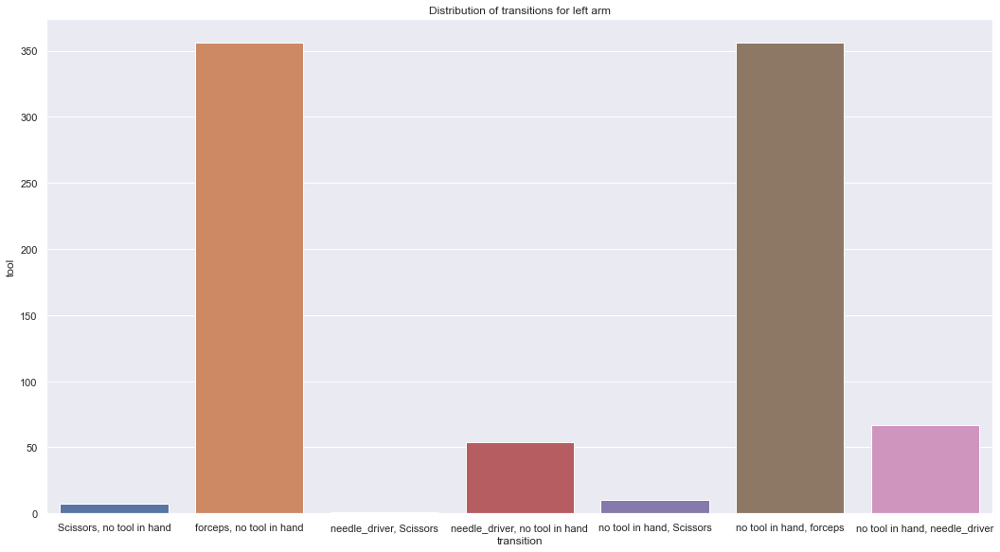

In [105]:
sns.set(rc={'figure.figsize':(15,8.27)})
transition_count = left_df.groupby('transition').count()
sns.barplot(data=transition_count, x=transition_count.index, y="tool")
plt.title("Distribution of transitions for left arm")
plt.tight_layout()
plt.show()

In [106]:
right_df = duckdb.query("""SELECT *, lead(tool, 1) over (partition by file_name order by file_name, start_time) as next_tool FROM right_tu_df""").df()

In [107]:
right_df['next_tool_name'] = right_df.next_tool.map(tool_mapping)

In [108]:
right_df['transition'] = right_df['tool_name'] + ", " + right_df['next_tool_name']

The right hand mainly moves between picking up and putting down the scissors and needle driver

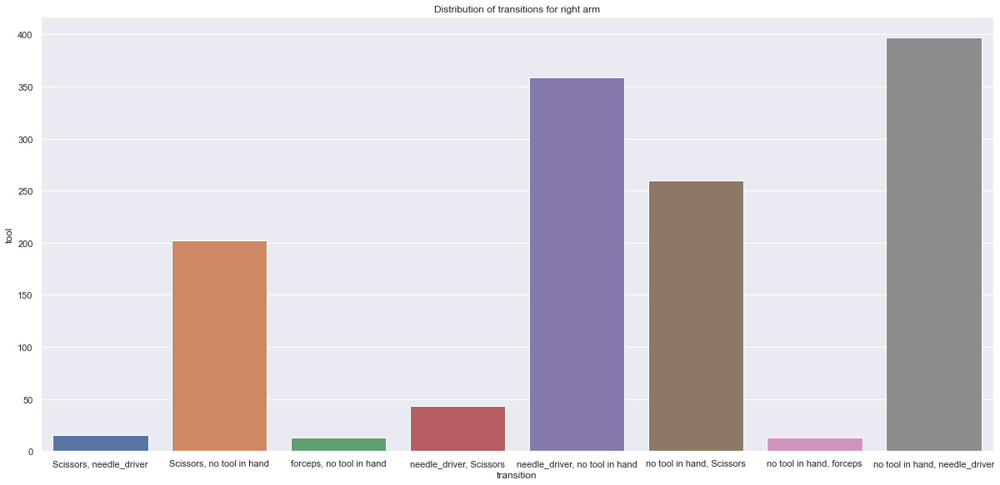

In [110]:
sns.set(rc={'figure.figsize':(17,8.27)})
transition_count = right_df.groupby('transition').count()
sns.barplot(data=transition_count, x=transition_count.index, y="tool")
plt.title("Distribution of transitions for right arm")
plt.tight_layout()
plt.show()

## Testing yolo5 o

Using cache found in /home/datalore/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2022-12-1 Python-3.8.12 torch-1.10.1+cpu CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


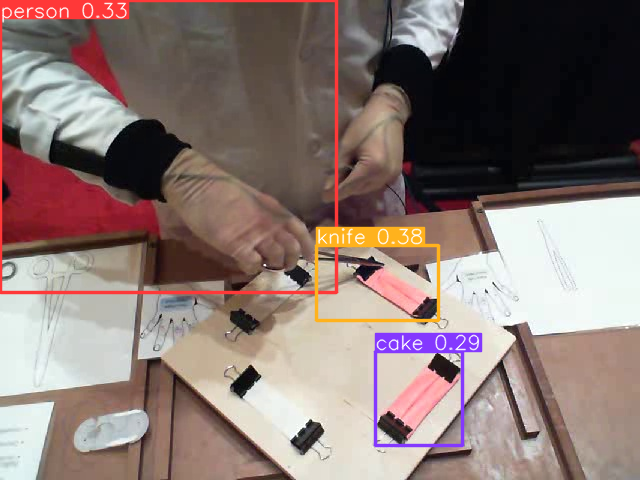

In [14]:
# Model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')  # or yolov5n - yolov5x6, custom

# Images
img = '/data/notebook_files/HW1_dataset/images/P016_balloon1_1006.jpg'  # or file, Path, PIL, OpenCV, numpy, list

# Inference
results = model(img)

# Results
results.show()  # or .show(), .save(), .crop(), .pandas(), etc.

## Loading DataSet

In [19]:
%cd /data/notebook_files/yolov5

/data/notebook_files/yolov5


In [20]:
from roboflow import Roboflow

rf = Roboflow(api_key="mA7koMgDVFBLYkhBiJtz")
project = rf.workspace("ilanitdavidcv1").project("hw1-kychx")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to HW1-1 in yolov5pytorch:: 100%|██████████| 3838/3838 [00:31<00:00, 122.75it/s]


In [21]:
%cat {dataset.location}/data.yaml

names:
- Left_Empty
- Left_Forceps
- Left_Needle_driver
- Left_Scissors
- Right_Empty
- Right_Needle_driver
- Right_Scissors
nc: 7
roboflow:
  license: CC BY 4.0
  project: hw1-kychx
  url: https://universe.roboflow.com/project/hw1-kychx/dataset/1
  version: 1
  workspace: project
test: ../test/images
train: HW1-1/train/images
val: HW1-1/valid/images


# Define Model Configuration and Architecture
We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

In [22]:
# define number of classes based on YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [23]:
#this is the model configuration which is default
%cat yolov5/models/yolov5s.yaml

cat: yolov5/models/yolov5s.yaml: No such file or directory


In [24]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [26]:
%%writetemplate /data/notebook_files/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

## Train Custom YOLOv5 Detector

Next, we'll fire off training!
Here, we are able to pass a number of arguments:

img: define input image size

batch: determine batch size

epochs: define the number of training epochs. (Note: often, 3000+ are common here!)

data: set the path to our yaml file

cfg: specify our model configuration

weights: specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive folder)

name: result names

nosave: only save the final checkpoint

cache: cache images for faster training

In [27]:
# train yolov5s on custom data for 100 epochs
# time its performance
%time
%cd /data/notebook_files/yolov5pip
!python train.py --img 640 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 7.39 µs
/data/notebook_files/yolov5
train: weights=, cfg=./models/custom_yolov5s.yaml, data=/data/notebook_files/yolov5/HW1-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-12-g7f5724b Python-3.8.12 torch-1.10.1+cpu CPU

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1,